In [ ]:
# @title Unet ++ Segmentation-Guided EfficientNetB0 Pipeline for Breast Ultrasound Classification
import os
import cv2
import numpy as np
from glob import glob
from tqdm import tqdm
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score
from sklearn.utils import class_weight
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, Input, Concatenate, Multiply, Reshape
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
import matplotlib.pyplot as plt

# Basic settings
IMG_SIZE = 224
BATCH_SIZE = 32
EPOCHS = 50
SEED = 42
np.random.seed(SEED)
tf.random.set_seed(SEED)

# 1. Image Preprocessing
class ImagePreprocessor:
    def __init__(self, segmentation_model_path=None):
        self.seg_model = tf.keras.models.load_model(segmentation_model_path) if segmentation_model_path else None

    def apply_segmentation(self, img):
        """Segmentation with advanced post-processing"""
        img_for_seg = cv2.resize(img, (128, 128)) / 255.0
        segmented = self.seg_model.predict(np.expand_dims(img_for_seg, axis=(0, -1)), verbose=0)[0]
        segmented = cv2.resize(segmented[..., 0], (IMG_SIZE, IMG_SIZE))

        # Post-processing of the mask
        segmented = (segmented > 0.6).astype(np.float32)
        kernel = np.ones((3,3), np.uint8)
        segmented = cv2.morphologyEx(segmented, cv2.MORPH_OPEN, kernel)
        segmented = cv2.GaussianBlur(segmented, (5,5), 0)
        return segmented

    def adaptive_fusion(self, img, mask):
        """Adaptive fusion based on image content"""

        enhanced_img = np.where(mask > 0,
                              np.clip(img*1.3, 0, 1),
                              np.clip(img*0.8, 0, 1))
        return np.stack([img, enhanced_img, mask], axis=-1)

    def process(self, img_path):
        """Complete preprocessing pipeline"""
        try:
            img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
            if img is None:
                return None

            img = cv2.resize(img, (IMG_SIZE, IMG_SIZE)) / 255.0

            if self.seg_model:
                mask = self.apply_segmentation(img)
                return self.adaptive_fusion(img, mask)
            return np.expand_dims(img, -1)
        except Exception as e:
            print(f"Error processing {img_path}: {str(e)}")
            return None

# 2. Data Loading and Augmentation
class DataLoader:
    def __init__(self, base_path):
        self.base_path = base_path
        self.preprocessor = ImagePreprocessor('fast_unetpp_model.h5')

    def load_dataset(self, max_samples=None, augment=True):
        X, Y = [], []
        for cls_idx, cls in enumerate(['benign', 'malignant']):
            path = os.path.join(self.base_path, cls)
            files = glob(os.path.join(path, '*.png'))
            files = [f for f in files if '_mask' not in f]

            if max_samples:
                files = files[:max_samples]

            for img_path in tqdm(files, desc=f'Loading {cls}'):
                processed_img = self.preprocessor.process(img_path)
                if processed_img is not None:
                    X.append(processed_img)
                    Y.append(cls_idx)

        X, Y = np.array(X), np.array(Y)

        if augment:
            X, Y = self.augment_data(X, Y)

        return X, Y

    def augment_data(self, X, Y):
         """Data augmentation (flips)"""
        X_aug, Y_aug = [], []
        for x, y in zip(X, Y):
            X_aug.append(x)
            Y_aug.append(y)


            X_aug.append(np.flip(x, axis=1))
            Y_aug.append(y)


            X_aug.append(np.flip(x, axis=0))
            Y_aug.append(y)

        return np.array(X_aug), np.array(Y_aug)


# 3. Build Advanced Model (EfficientNetB0)
def build_enhanced_model(input_shape):

    inputs = Input(shape=input_shape)

    # Convert to 3 channels if needed
    if input_shape[-1] == 1:
        x = Concatenate()([inputs, inputs, inputs])
    else:
        x = inputs

    base_model = EfficientNetB0(
        include_top=False,
        weights='imagenet',
        input_shape=(IMG_SIZE, IMG_SIZE, 3),
        pooling='avg'
    )

    # Freeze part of the base model
    for layer in base_model.layers[:150]:
        layer.trainable = False

    x = base_model(x)
    x = Dropout(0.5)(x)


    x = Dense(512, activation='swish')(x)
    x = Dropout(0.4)(x)
    x = Dense(256, activation='swish')(x)
    x = Dropout(0.3)(x)

    outputs = Dense(1, activation='sigmoid')(x)

    model = Model(inputs, outputs)

    model.compile(
        optimizer=Adam(learning_rate=1e-4),
        loss='binary_crossentropy',
        metrics=[
            'accuracy',
            tf.keras.metrics.AUC(name='auc'),
            tf.keras.metrics.Precision(name='precision'),
            tf.keras.metrics.Recall(name='recall')
        ]
    )
    return model

# 4. Training and Evaluation
class Trainer:
    def __init__(self, model):
        self.model = model

    def train(self, X_train, y_train, X_val, y_val):
        callbacks = [
            EarlyStopping(
                monitor='val_auc',
                patience=20,
                mode='max',
                restore_best_weights=True,
                verbose=1
            ),
            ReduceLROnPlateau(
                monitor='val_loss',
                factor=0.2,
                patience=8,
                min_lr=1e-6,
                verbose=1
            ),
            ModelCheckpoint(
                'best_model.weights.h5',
                monitor='val_auc',
                mode='max',
                save_best_only=True,
                save_weights_only=True,
                verbose=1
            )
        ]

        class_weights = class_weight.compute_class_weight(
            'balanced',
            classes=np.unique(y_train),
            y=y_train
        )
        class_weights = {i: w for i, w in enumerate(class_weights)}

        history = self.model.fit(
            X_train, y_train,
            validation_data=(X_val, y_val),
            epochs=EPOCHS,
            batch_size=BATCH_SIZE,
            class_weight=class_weights,
            callbacks=callbacks,
            verbose=1
        )
        return history

    def evaluate(self, X_test, y_test):
        y_pred = self.model.predict(X_test)
        y_pred_class = (y_pred > 0.5).astype(int)

        print("\nClassification Report:")
        print(classification_report(y_test, y_pred_class, target_names=["Benign", "Malignant"]))

        print("\nConfusion Matrix:")
        print(confusion_matrix(y_test, y_pred_class))

        print(f"\nAUC Score: {roc_auc_score(y_test, y_pred):.4f}")

        return y_pred


def main():

    print("🔍 Loading data...")
    data_loader = DataLoader("/content/Dataset_BUSI_with_GT")
    X, Y = data_loader.load_dataset(max_samples=500, augment=True)


    print("\n✂️ Splitting data...")
    X_train, X_test, y_train, y_test = train_test_split(
        X, Y, test_size=0.15, random_state=SEED, stratify=Y
    )
    X_train, X_val, y_train, y_val = train_test_split(
        X_train, y_train, test_size=0.15, random_state=SEED, stratify=y_train
    )


    print("\n🧠 Building model...")
    model = build_enhanced_model(X_train.shape[1:])
    model.summary()


    print("\n🎯 Training model...")
    trainer = Trainer(model)
    history = trainer.train(X_train, y_train, X_val, y_val)


    print("\n📊 Evaluating model...")
    trainer.evaluate(X_test, y_test)


    model.save('final_model.h5')
    print("\n✅ Training completed and model saved!")

if __name__ == "__main__":
    main()

🔍 Loading data...


Loading malignant: 100%|██████████| 210/210 [00:29<00:00,  7.01it/s]



✂️ Splitting data...

🧠 Building model...
16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 1280)           │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │       655,872 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,837,028 (18.45 MB)

 Trainable params: 4,075,161 (15.55 MB)

 Non-trainable params: 761,867 (2.91 MB)


🎯 Training model...
Epoch 1/50
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.5226 - auc: 0.5158 - loss: 0.6941 - precision: 0.3233 - recall: 0.4949
Epoch 1: val_auc improved from -inf to 0.50000, saving model to best_model.weights.h5
44/44 ━━━━━━━━━━━━━━━━━━━━ 196s 4s/step - accuracy: 0.5231 - auc: 0.5157 - loss: 0.6943 - precision: 0.3236 - recall: 0.4931 - val_accuracy: 0.3226 - val_auc: 0.5000 - val_loss: 0.6944 - val_precision: 0.3226 - val_recall: 1.0000 - learning_rate: 1.0000e-04
Epoch 2/50
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.4919 - auc: 0.5251 - loss: 0.6963 - precision: 0.3365 - recall: 0.6366
Epoch 2: val_auc did not improve from 0.50000
44/44 ━━━━━━━━━━━━━━━━━━━━ 201s 4s/step - accuracy: 0.4929 - auc: 0.5253 - loss: 0.6964 - precision: 0.3370 - recall: 0.6344 - val_accuracy: 0.3226 - val_auc: 0.5000 - val_loss: 0.6946 - val_precision: 0.3226 - val_recall: 1.0000 - learning_rate: 1.0000e-04
Epoch 3/50
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.


Classification Report:
              precision    recall  f1-score   support

      Benign       0.86      0.81      0.83       197
   Malignant       0.64      0.73      0.68        95

    accuracy                           0.78       292
   macro avg       0.75      0.77      0.76       292
weighted avg       0.79      0.78      0.78       292


Confusion Matrix:
[[159  38]
 [ 26  69]]

AUC Score: 0.8610

✅ Training completed and model saved!


In [ ]:
# @title Segmentation-Guided EfficientNetB0 with Grad-CAM Visualization for Breast Ultrasound Classification

def get_gradcam_heatmap(model, image, class_index=None, layer_name='top_conv'):
    grad_model = tf.keras.models.Model([model.inputs], [model.get_layer(layer_name).output, model.output])
    with tf.GradientTape() as tape:
        inputs = tf.cast(np.expand_dims(image, axis=0), tf.float32)
        conv_outputs, predictions = grad_model(inputs)
        if class_index is None:
            class_index = tf.argmax(predictions[0])
        loss = predictions[:, class_index]
    grads = tape.gradient(loss, conv_outputs)[0]
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1))
    conv_outputs = conv_outputs[0]
    heatmap = tf.reduce_sum(tf.multiply(pooled_grads, conv_outputs), axis=-1)
    heatmap = np.maximum(heatmap, 0)
    heatmap /= (np.max(heatmap) + 1e-10)
    return heatmap.numpy()

def overlay_heatmap(img, heatmap, alpha=0.5):
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap_colored = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)
    if img.shape[-1] == 1:
        img = np.concatenate([img]*3, axis=-1)
    overlayed = cv2.addWeighted(np.uint8(255 * img), 1 - alpha, heatmap_colored, alpha, 0)
    return overlayed

def show_gradcam(model, images, labels=None, layer_name='top_conv'):
    for i, image in enumerate(images):
        heatmap = get_gradcam_heatmap(model, image, layer_name=layer_name)
        overlayed = overlay_heatmap(image, heatmap)
        plt.figure(figsize=(10, 4))
        plt.subplot(1, 3, 1)
        plt.imshow(image[..., 0], cmap='gray')
        plt.title("Original")
        plt.subplot(1, 3, 2)
        plt.imshow(heatmap, cmap='jet')
        plt.title("Grad-CAM")
        plt.subplot(1, 3, 3)
        plt.imshow(overlayed[..., ::-1])
        title = f"Overlay ({['Benign','Malignant'][labels[i]]})" if labels is not None else "Overlay"
        plt.title(title)
        plt.axis('off')
        plt.tight_layout()
        plt.show()


def main():
    print("📥 Loading data...")
    data_loader = DataLoader("/content/Dataset_BUSI_with_GT")
    X, Y = data_loader.load_dataset(max_samples=500, augment=True)

    print("\n✂️ Splitting data...")
    X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.15, random_state=SEED, stratify=Y)
    X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.15, random_state=SEED, stratify=y_train)

    print("\n🧠 Building model...")
    model = build_enhanced_model(X_train.shape[1:])
    model.summary()

    print("\n🎯 Training model...")
    trainer = Trainer(model)
    trainer.train(X_train, y_train, X_val, y_val)

    print("\n📊 Evaluating model...")
    trainer.evaluate(X_test, y_test)

    print("\n🔥 Generating Grad-CAM...")
    sample_images = X_test[:4]
    sample_labels = y_test[:4]
    show_gradcam(model, sample_images, sample_labels)

    model.save('final_model_with_gradcam.h5')
    print("\n✅ Done!")

if __name__ == "__main__":
    main()

📥 Loading data...


Loading malignant: 100%|██████████| 210/210 [00:30<00:00,  6.90it/s]



✂️ Splitting data...


In [ ]:
!pip install grad-cam


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 54.6 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 56.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 18.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 24.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 10.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 74.8 MB/s e

In [ ]:
!pip install efficientnet_pytorch


  Preparing metadata (setup.py) ... done
  Created wheel for efficientnet_pytorch: filename=efficientnet_pytorch-0.7.1-py3-none-any.whl size=16426 sha256=7773ddccc010744fefd71caa3c5e6671797f6fc8ca9fad47ea051c481ce8679b
  Stored in directory: /root/.cache/pip/wheels/8b/6f/9b/231a832f811ab6ebb1b32455b177ffc6b8b1cd8de19de70c09
Successfully built efficientnet_pytorch


Loaded pretrained weights for efficientnet-b0


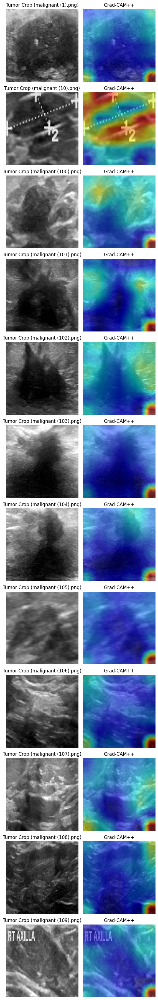

In [ ]:
# @title Grad-CAM++ Visualization on Cropped Malignant Tumor Regions
import os
import torch
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from torchvision import transforms
from pytorch_grad_cam import GradCAMPlusPlus
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
from efficientnet_pytorch import EfficientNet

# Set paths
malignant_dir = "/content/Dataset_BUSI_with_GT/malignant"
all_files = sorted(os.listdir(malignant_dir))
image_files = [f for f in all_files if f.endswith('.png') and '_mask' not in f]

# Select first 12 malignant images
selected_files = image_files[:12]

# Load model
model = EfficientNet.from_pretrained("efficientnet-b0")
model.eval()
target_layer = model._conv_head
cam = GradCAMPlusPlus(model=model, target_layers=[target_layer])

# Transform for model input
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

# Plotting setup
fig, axes = plt.subplots(nrows=12, ncols=2, figsize=(6, 36))
fig.subplots_adjust(hspace=0.3)

with cam:
    for idx, filename in enumerate(selected_files):
        image_path = os.path.join(malignant_dir, filename)
        mask_path = image_path.replace(".png", "_mask.png")

        # Load image and mask
        image = Image.open(image_path).convert("RGB")
        mask = Image.open(mask_path).convert("L")

        # Convert mask to array and find bounding box
        mask_np = np.array(mask)
        ys, xs = np.where(mask_np > 0)
        if len(xs) == 0 or len(ys) == 0:
            print(f"⚠️ No tumor area in: {filename}")
            continue
        x_min, x_max = np.min(xs), np.max(xs)
        y_min, y_max = np.min(ys), np.max(ys)

        # Crop image to tumor area
        cropped = image.crop((x_min, y_min, x_max, y_max)).resize((224, 224))
        input_tensor = transform(cropped).unsqueeze(0)

        # Run Grad-CAM++
        targets = [ClassifierOutputTarget(1)]
        grayscale_cam = cam(input_tensor=input_tensor, targets=targets)[0]
        cropped_np = np.array(cropped).astype(np.float32) / 255.0
        cam_image = show_cam_on_image(cropped_np, grayscale_cam, use_rgb=True)

        # Plot original crop and CAM
        axes[idx, 0].imshow(cropped)
        axes[idx, 0].set_title(f"Tumor Crop ({filename})")
        axes[idx, 0].axis("off")

        axes[idx, 1].imshow(cam_image)
        axes[idx, 1].set_title("Grad-CAM++")
        axes[idx, 1].axis("off")

# Save final figure
plt.tight_layout()
plt.savefig("gradcam_malignant_12_samples.png", dpi=300)
plt.show()


Loaded pretrained weights for efficientnet-b0


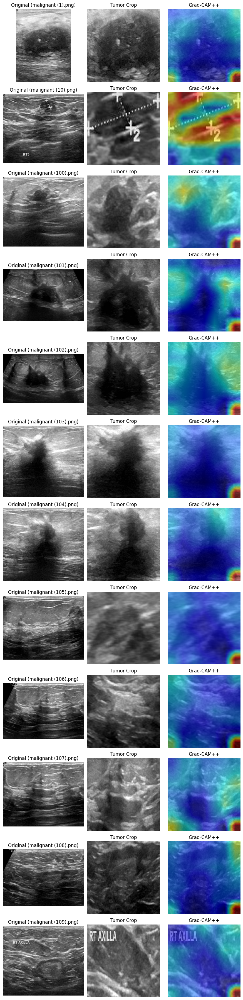

In [ ]:
# @title Comparison of Original, Tumor Crop, and Grad-CAM++ Visualization for Malignant Breast Ultrasound Images
import os
import torch
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from torchvision import transforms
from pytorch_grad_cam import GradCAMPlusPlus
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
from efficientnet_pytorch import EfficientNet

# Set path to malignant class
malignant_dir = "/content/Dataset_BUSI_with_GT/malignant"
all_files = sorted(os.listdir(malignant_dir))
image_files = [f for f in all_files if f.endswith('.png') and '_mask' not in f]

# Select 12 malignant samples
selected_files = image_files[:12]

# Load model
model = EfficientNet.from_pretrained("efficientnet-b0")
model.eval()
target_layer = model._conv_head
cam = GradCAMPlusPlus(model=model, target_layers=[target_layer])

# Transform for EfficientNet
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

# Set up 12 rows × 3 columns plot
fig, axes = plt.subplots(nrows=12, ncols=3, figsize=(9, 36))
fig.subplots_adjust(hspace=0.4)

with cam:
    for idx, filename in enumerate(selected_files):
        image_path = os.path.join(malignant_dir, filename)
        mask_path = image_path.replace(".png", "_mask.png")

        # Load image and mask
        image = Image.open(image_path).convert("RGB")
        mask = Image.open(mask_path).convert("L")
        mask_np = np.array(mask)

        # Find bounding box from mask
        ys, xs = np.where(mask_np > 0)
        if len(xs) == 0 or len(ys) == 0:
            print(f"⚠️ No tumor found in mask for: {filename}")
            continue
        x_min, x_max = np.min(xs), np.max(xs)
        y_min, y_max = np.min(ys), np.max(ys)

        # Crop tumor region
        crop = image.crop((x_min, y_min, x_max, y_max)).resize((224, 224))
        input_tensor = transform(crop).unsqueeze(0)

        # Grad-CAM++
        targets = [ClassifierOutputTarget(1)]
        grayscale_cam = cam(input_tensor=input_tensor, targets=targets)[0]
        crop_np = np.array(crop).astype(np.float32) / 255.0
        cam_image = show_cam_on_image(crop_np, grayscale_cam, use_rgb=True)

        # Plot original image
        axes[idx, 0].imshow(image)
        axes[idx, 0].set_title(f"Original ({filename})")
        axes[idx, 0].axis("off")

        # Plot crop
        axes[idx, 1].imshow(crop)
        axes[idx, 1].set_title("Tumor Crop")
        axes[idx, 1].axis("off")

        # Plot CAM
        axes[idx, 2].imshow(cam_image)
        axes[idx, 2].set_title("Grad-CAM++")
        axes[idx, 2].axis("off")

# Save the output figure
plt.tight_layout()
plt.savefig("gradcam_malignant_12_with_original.png", dpi=300)
plt.show()


Loaded pretrained weights for efficientnet-b0


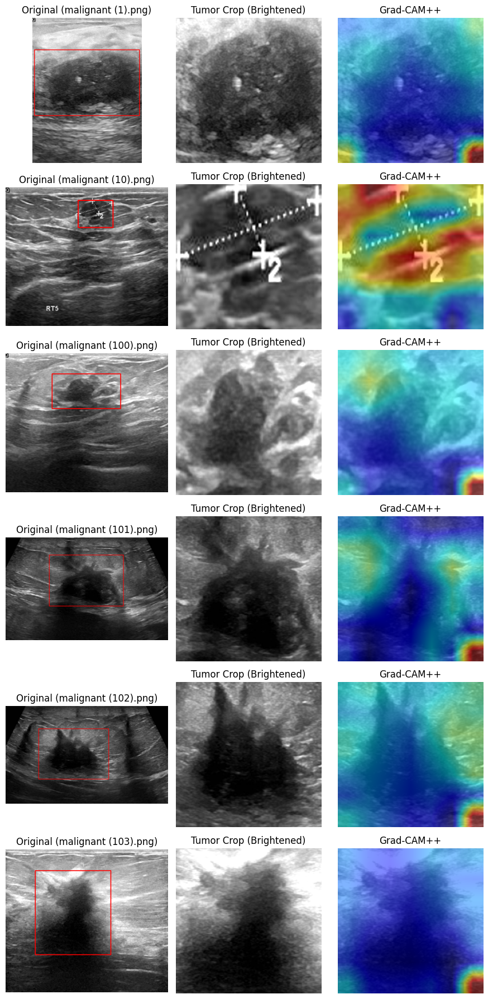

TypeError: unsupported operand type(s) for ** or pow(): 'NoneType' and 'int'

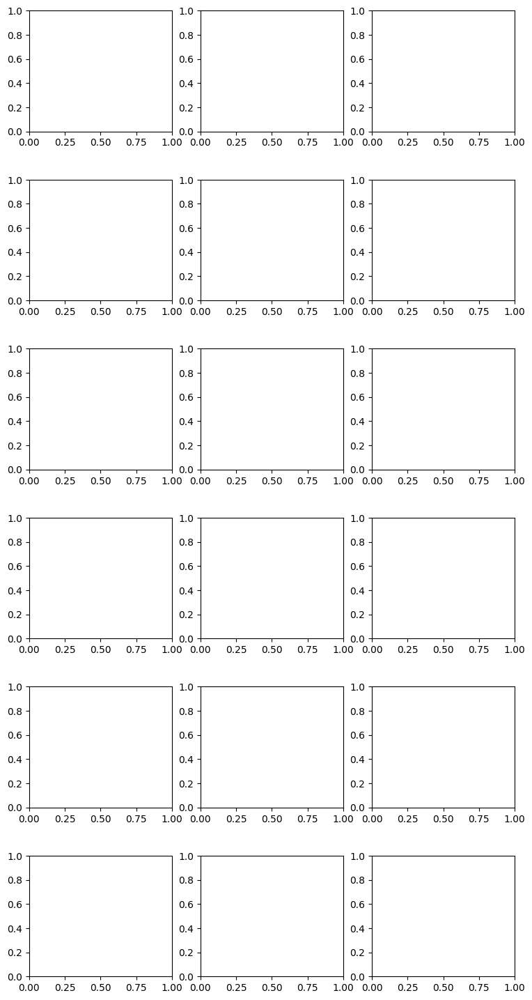

In [ ]:
# @title Visualization of Malignant Lesions with Bounding Box and Grad-CAM++ using EfficientNet-B0
import os
import torch
import numpy as np
from PIL import Image, ImageEnhance
import matplotlib.pyplot as plt
from torchvision import transforms
from pytorch_grad_cam import GradCAMPlusPlus
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
from efficientnet_pytorch import EfficientNet
import cv2

# Paths
malignant_dir = "/content/Dataset_BUSI_with_GT/malignant"
all_files = sorted(os.listdir(malignant_dir))
image_files = [f for f in all_files if f.endswith('.png') and '_mask' not in f]
selected_files = image_files[:12]

# Model
model = EfficientNet.from_pretrained("efficientnet-b0")
model.eval()
target_layer = model._conv_head
cam = GradCAMPlusPlus(model=model, target_layers=[target_layer])

# Preprocessing
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

# For each batch of 6 images
for batch_id in range(2):
    fig, axes = plt.subplots(nrows=6, ncols=3, figsize=(9, 18))
    fig.subplots_adjust(hspace=0.4)

    with cam:
        for i in range(6):
            idx = batch_id * 6 + i
            filename = selected_files[idx]
            image_path = os.path.join(malignant_dir, filename)
            mask_path = image_path.replace(".png", "_mask.png")

            image = Image.open(image_path).convert("RGB")
            mask = Image.open(mask_path).convert("L")
            mask_np = np.array(mask)

            ys, xs = np.where(mask_np > 0)
            if len(xs) == 0 or len(ys) == 0:
                print(f"⚠️ No tumor in {filename}")
                continue

            x_min, x_max = np.min(xs), np.max(xs)
            y_min, y_max = np.min(ys), np.max(ys)

            # Add bounding box to original image
            image_with_box = np.array(image).copy()
            cv2.rectangle(image_with_box, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)

            # Crop and enhance brightness
            crop = image.crop((x_min, y_min, x_max, y_max)).resize((224, 224))
            crop = ImageEnhance.Brightness(crop).enhance(1.2)  # brighten

            input_tensor = transform(crop).unsqueeze(0)
            targets = [ClassifierOutputTarget(1)]
            grayscale_cam = cam(input_tensor=input_tensor, targets=targets)[0]

            crop_np = np.array(crop).astype(np.float32) / 255.0
            cam_image = show_cam_on_image(crop_np, grayscale_cam, use_rgb=True)

            # Plot original with box
            axes[i, 0].imshow(image_with_box)
            axes[i, 0].set_title(f"Original ({filename})")
            axes[i, 0].axis("off")

            # Plot crop
            axes[i, 1].imshow(crop)
            axes[i, 1].set_title("Tumor Crop (Brightened)")
            axes[i, 1].axis("off")

            # Plot Grad-CAM++
            axes[i, 2].imshow(cam_image)
            axes[i, 2].set_title("Grad-CAM++")
            axes[i, 2].axis("off")

    # Save each batch
    plt.tight_layout()
    plt.savefig(f"malignant_gradcam_part{batch_id+1}.pdf", dpi=300, bbox_inches='tight')
    plt.show()


Loaded pretrained weights for efficientnet-b0


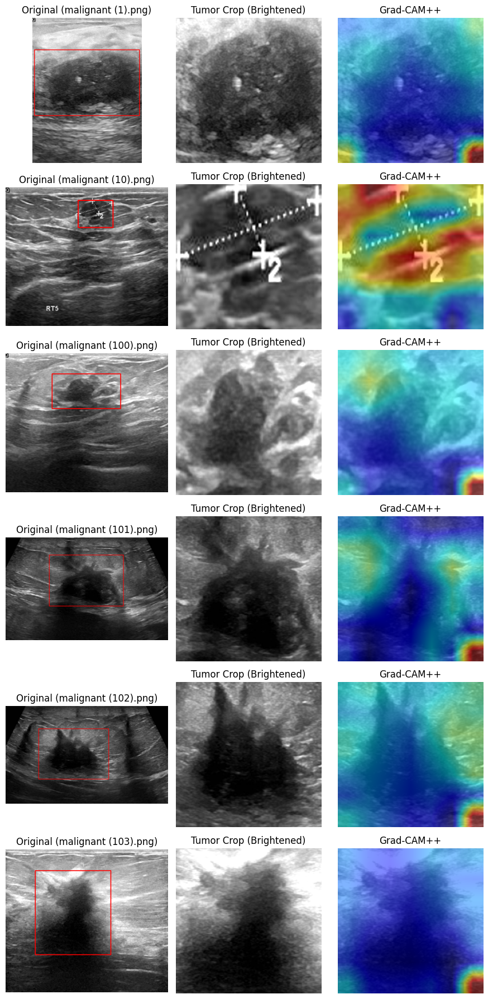

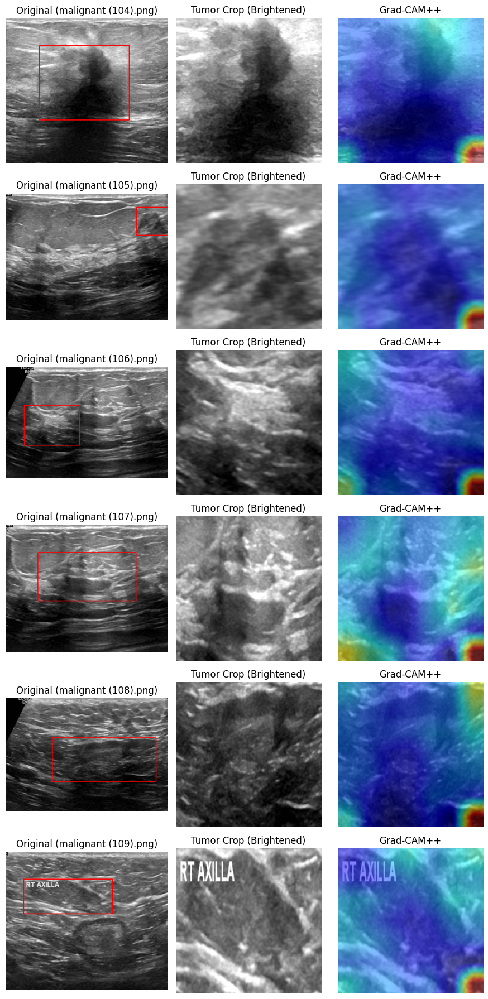

In [ ]:
# @title Grad-CAM++ Visualization of Malignant Breast Tumors Using EfficientNet-B0
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageEnhance
from torchvision import transforms
from pytorch_grad_cam import GradCAMPlusPlus
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
from efficientnet_pytorch import EfficientNet
import cv2

# Path to dataset
malignant_dir = "/content/Dataset_BUSI_with_GT/malignant"
all_files = sorted(os.listdir(malignant_dir))
image_files = [f for f in all_files if f.endswith('.png') and '_mask' not in f]
selected_files = image_files[:12]  # Select first 12 malignant cases

# Load model
model = EfficientNet.from_pretrained("efficientnet-b0")
model.eval()
target_layer = model._conv_head

# Transformation for EfficientNet
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

# Process in two batches of 6 for better layout
for batch_id in range(2):
    fig, axes = plt.subplots(nrows=6, ncols=3, figsize=(9, 18))
    fig.subplots_adjust(hspace=0.4)

    for i in range(6):
        idx = batch_id * 6 + i
        filename = selected_files[idx]
        image_path = os.path.join(malignant_dir, filename)
        mask_path = image_path.replace(".png", "_mask.png")

        # Load image and mask
        image = Image.open(image_path).convert("RGB")
        mask = Image.open(mask_path).convert("L")
        mask_np = np.array(mask)

        # Get bounding box of tumor from mask
        ys, xs = np.where(mask_np > 0)
        if len(xs) == 0 or len(ys) == 0:
            print(f"⚠️ No tumor found in mask for: {filename}")
            continue
        x_min, x_max = np.min(xs), np.max(xs)
        y_min, y_max = np.min(ys), np.max(ys)

        # Draw bounding box on original image
        image_with_box = np.array(image).copy()
        cv2.rectangle(image_with_box, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)

        # Crop and enhance brightness
        crop = image.crop((x_min, y_min, x_max, y_max)).resize((224, 224))
        crop = ImageEnhance.Brightness(crop).enhance(1.2)

        # Preprocess and run Grad-CAM++ safely
        input_tensor = transform(crop).unsqueeze(0)
        targets = [ClassifierOutputTarget(1)]

        # Run Grad-CAM++ for this sample
        with GradCAMPlusPlus(model=model, target_layers=[target_layer]) as cam:
            grayscale_cam = cam(input_tensor=input_tensor, targets=targets)[0]

        # Overlay CAM on image
        crop_np = np.array(crop).astype(np.float32) / 255.0
        cam_image = show_cam_on_image(crop_np, grayscale_cam, use_rgb=True)

        # Plot original
        axes[i, 0].imshow(image_with_box)
        axes[i, 0].set_title(f"Original ({filename})")
        axes[i, 0].axis("off")

        # Plot crop
        axes[i, 1].imshow(crop)
        axes[i, 1].set_title("Tumor Crop (Brightened)")
        axes[i, 1].axis("off")

        # Plot CAM
        axes[i, 2].imshow(cam_image)
        axes[i, 2].set_title("Grad-CAM++")
        axes[i, 2].axis("off")

    # Save output
    plt.tight_layout()
    plt.savefig(f"malignant_gradcam_part{batch_id+1}.pdf", dpi=300, bbox_inches='tight')
    plt.show()
